# Load the data

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv("data/Big_cleaned_data.csv", encoding="utf-8")

# Display the first few rows to verify the data
print("First few rows of the dataset:")
print("\nRenaming columns:")
df = df.rename(
    columns={
        "stock__share_type__company__industry__industry_group__sector__name": "sector",
        "stock__share_type__company__country__code": "country",
        "stock__share_type__company__name": "company",
    }
)
df.head()

print("\nShape of the dataset:")
print(df.shape)
print(df.columns)

First few rows of the dataset:

Renaming columns:

Shape of the dataset:
(10155, 18)
Index(['stock__ticker', 'company', 'sector', 'country', 'date', 'quality',
       'growth', 'value', 'dividend', 'market_cap_usd', 'enterprise_value_usd',
       'volume', 'profit_1m', 'profit_3m', 'profit_6m', 'profit_1y',
       'profit_2y', 'profit_5y'],
      dtype='object')


# Correlations

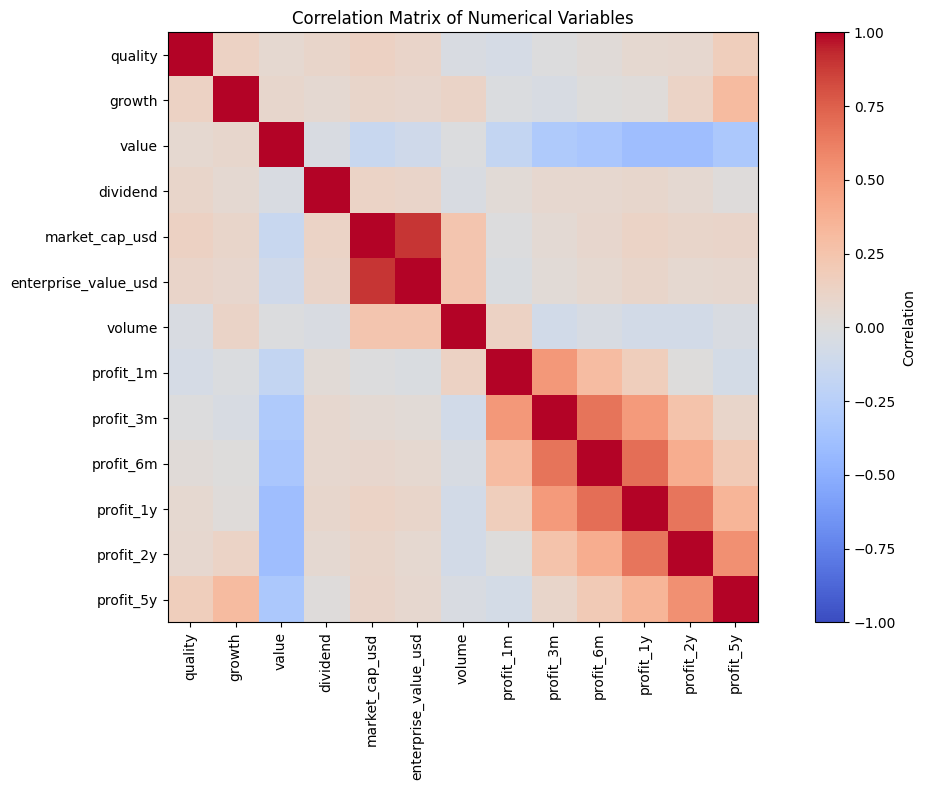

In [26]:
# Lets look for correlations between the variables
# Create a correlation matrix with only numerical columns
df_numeric = df.select_dtypes(include=["float64", "int64"])
correlation_matrix = df_numeric.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar(label="Correlation")
plt.xticks(
    range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90
)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Numerical Variables")
plt.tight_layout()
plt.show()

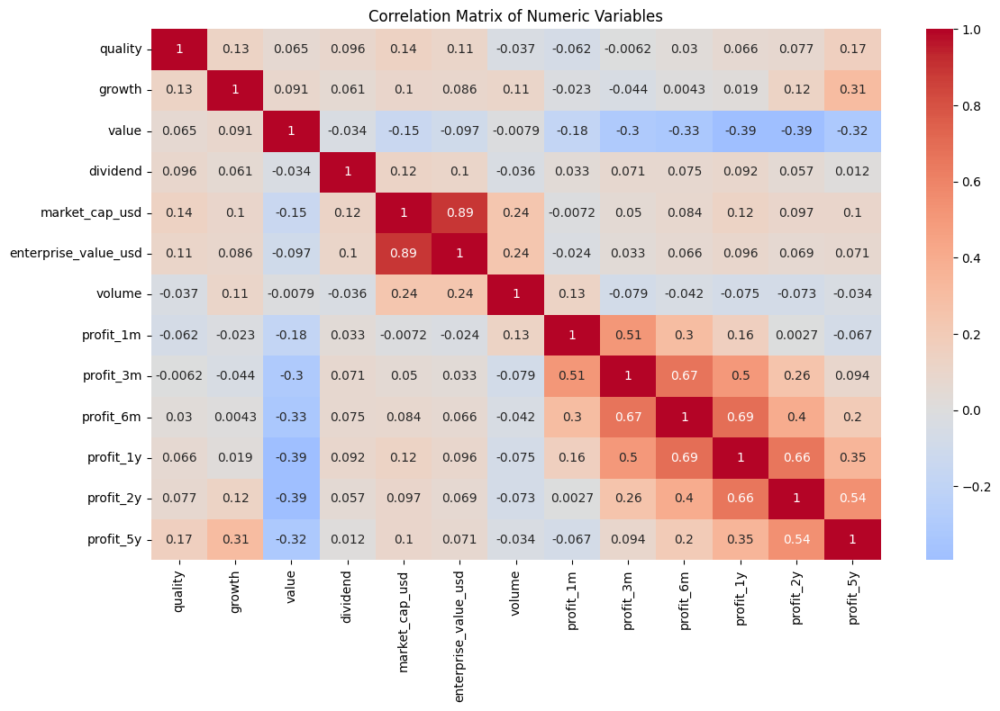

In [27]:
# Select only numeric columns
scores = [
    "quality",
    "growth",
    "value",
    "dividend",
    "market_cap_usd",
    "enterprise_value_usd",
    "volume",
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]

# Create correlation matrix using numeric columns only
df_numeric = df[scores]
correlation_matrix = df_numeric.corr()

# Plot using seaborn for better visualization
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()

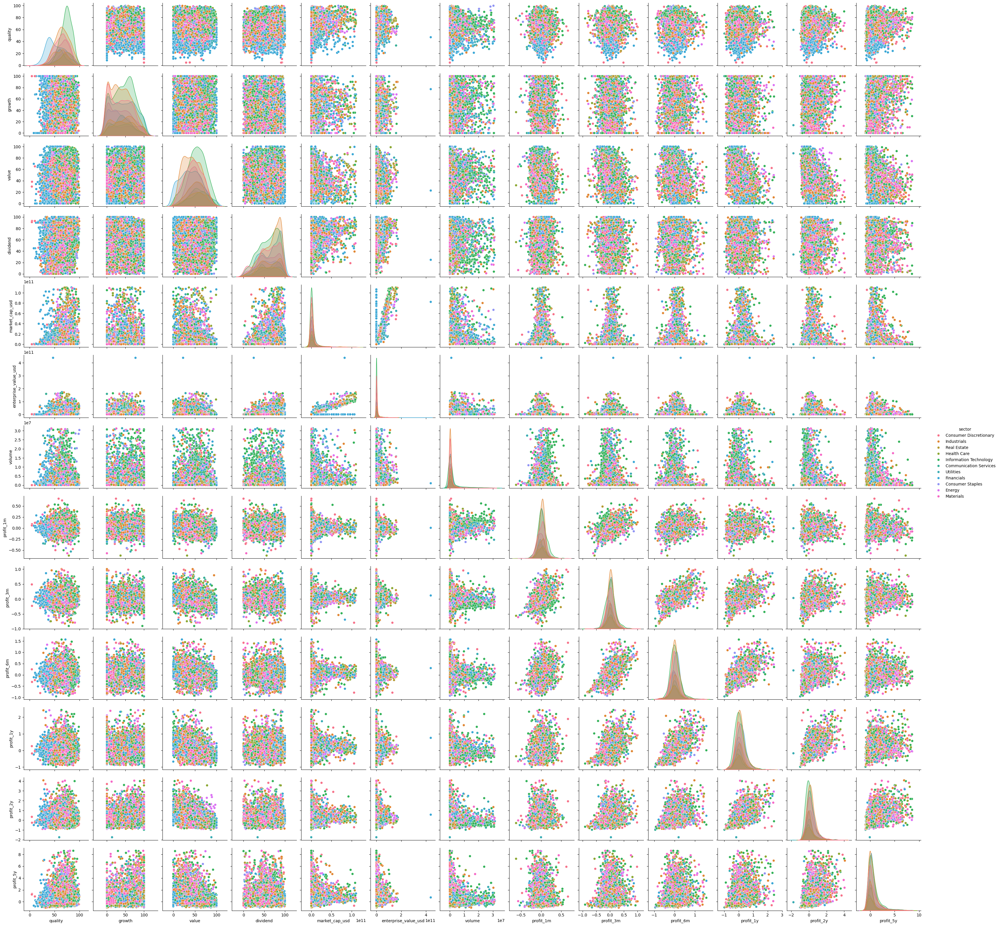

In [28]:
# Create pairplot using the correct dataframe and columns
sns.pairplot(
    df,
    hue="sector",
)
plt.show()

# PCA

Original data shape: (10155, 4)
Cleaned data shape (after removing NaNs): (10155, 4)
Number of rows removed: 0
Percentage of data retained: 100.0%


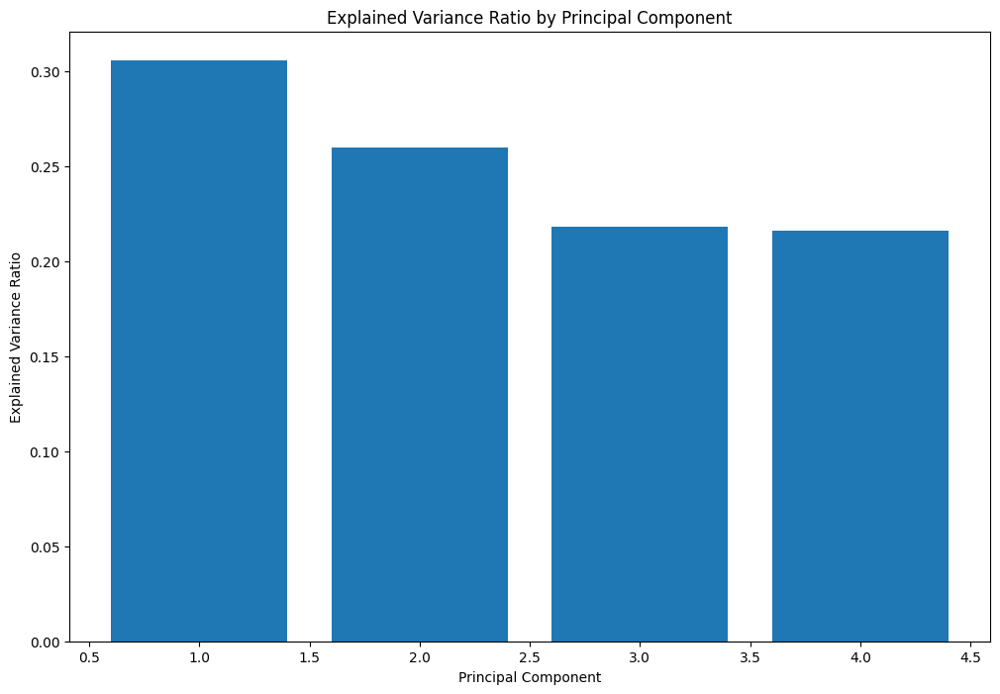

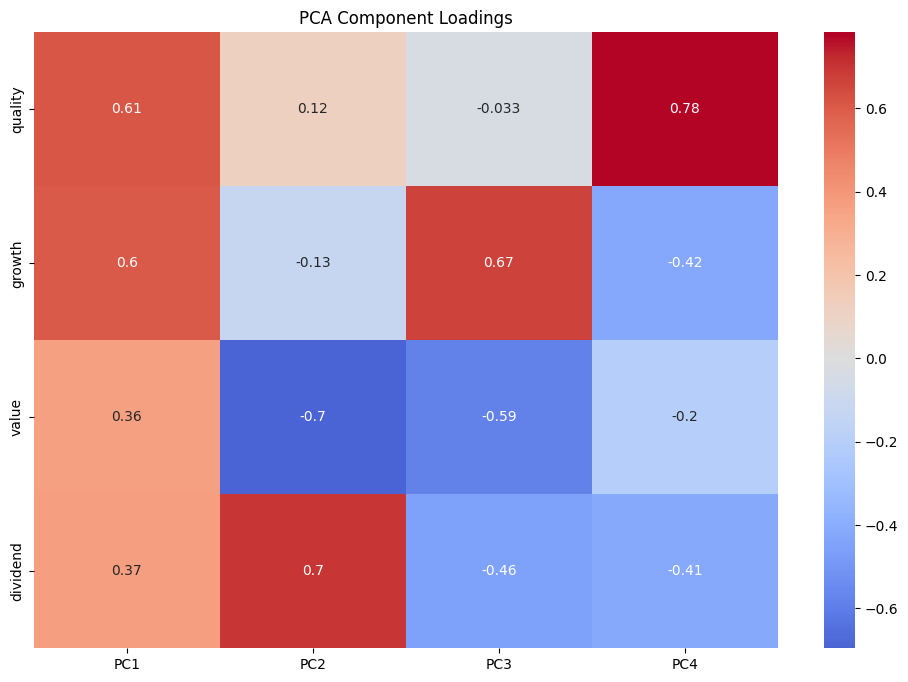

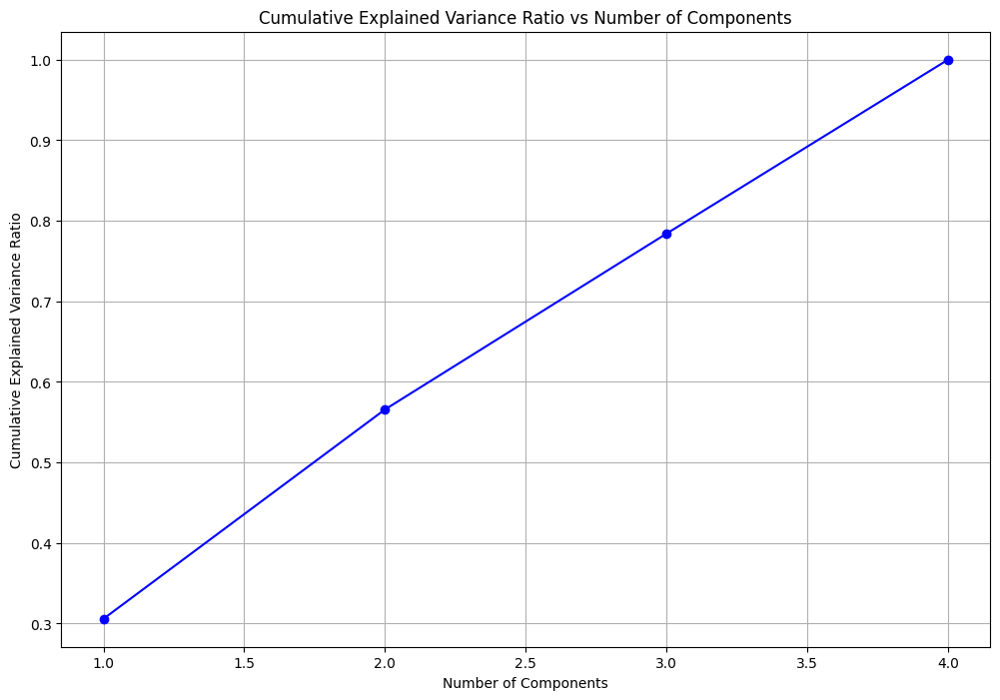

In [29]:
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# Prepare data for PCA
features = [
    "quality",
    "growth",
    "value",
    "dividend",
]
X = df[features]

# Standardize the features


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA

pca = PCA()
# Drop rows with NaN values before PCA
X_scaled_clean = X_scaled[~np.isnan(X_scaled).any(axis=1)]
# Compare size of cleaned vs original data
print(f"Original data shape: {X_scaled.shape}")
print(f"Cleaned data shape (after removing NaNs): {X_scaled_clean.shape}")
print(f"Number of rows removed: {X_scaled.shape[0] - X_scaled_clean.shape[0]}")
print(
    f"Percentage of data retained: {(X_scaled_clean.shape[0]/X_scaled.shape[0]*100):.1f}%"
)


X_pca = pca.fit_transform(X_scaled_clean)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance ratio
plt.figure(figsize=(12, 8))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Explained Variance Ratio by Principal Component")
plt.show()

# Create a DataFrame with component loadings
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)

# Plot heatmap of component loadings
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, annot=True, cmap="coolwarm", center=0)
plt.title("PCA Component Loadings")
plt.show()

# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, "bo-")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.title("Cumulative Explained Variance Ratio vs Number of Components")
plt.grid(True)
plt.show()

# Checking on outliers

9.494968919578108 13.289315526285492


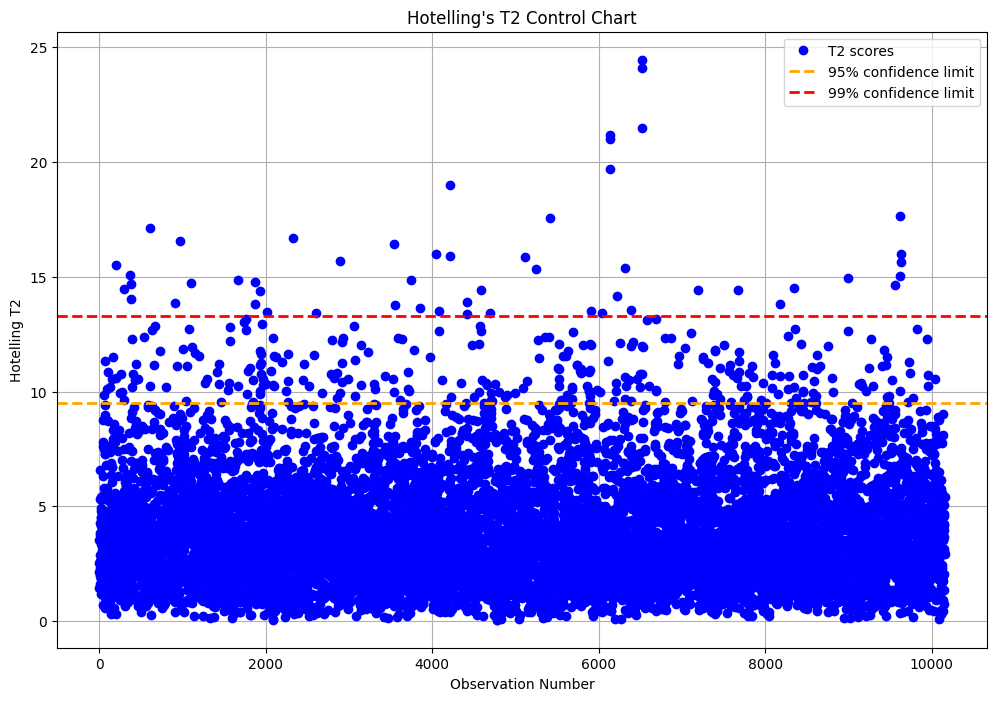

In [30]:
# Calculate Hotelling's T2 statistic
K = 4  # Number of principal components to use
scores = X_pca[:, :K]
t2_scores = np.sum(scores**2 / pca.explained_variance_[:K], axis=1)

# Calculate F-distribution critical values
n = len(X)  # Number of observations
F95 = (
    K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.95, K, n - K)
)  # ppf is the percent point function (inverse of cdf) of the F distribution
F99 = K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.99, K, n - K)
print(F95, F99)
# Plot Hotelling's T2
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(t2_scores) + 1), t2_scores, "bo", label="T2 scores")
plt.axhline(
    y=F95, color="orange", linestyle="--", linewidth=2, label="95% confidence limit"
)
plt.axhline(
    y=F99, color="red", linestyle="--", linewidth=2, label="99% confidence limit"
)
plt.xlabel("Observation Number")
plt.ylabel("Hotelling T2")
plt.title("Hotelling's T2 Control Chart")
plt.legend()
plt.grid(True)
plt.show()

In [31]:
# Delete the outliers
print(df.shape, t2_scores.shape)


df = df[t2_scores < F95]
X = df[features]
X_scaled = scaler.fit_transform(X)
X_pca = pca.fit_transform(X_scaled)

(10155, 18) (10155,)


In [24]:
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3", "PC4"])

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    df_pca[target_profit] = df[target_profit].values  # repeat per target

    sns.pairplot(
        df_pca,
        x_vars=["PC1", "PC2", "PC3", "PC4"],
        y_vars=target_profit,
        kind="hist",
    )
    plt.suptitle(f"PCA Components vs {target_profit}")
    correlations = df_pca.corr()[target_profit].drop(target_profit)
    print(f"Correlations with {target_profit}:\n", correlations)
    plt.show()

ValueError: Length of values (17632) does not match length of index (10592)

### Contribution to each variable

In [ ]:
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)
# Square the loadings
squared_loadings = loadings**2

# Normalize by each component to get % contribution
contributions = squared_loadings.div(squared_loadings.sum(axis=0), axis=1) * 100

plt.figure(figsize=(10, 6))
sns.heatmap(contributions, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Variable Contribution (%) to Principal Components")
plt.ylabel("Original Features")
plt.xlabel("Principal Components")
plt.tight_layout()
plt.show()

# Linear regression

In [ ]:
from sklearn.linear_model import LinearRegression

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    X = df_pca[["PC1", "PC2", "PC3", "PC4"]]  # or include more PCs
    y = df_pca[target_profit]

    model = LinearRegression()
    model.fit(X, y)
    r2 = model.score(X, y)
    print(f"R^2 for predicting {target_profit} from PCs: {r2:.3f}")

# ARIMAX

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
from pmdarima import auto_arima

# We'll create ARIMAX models for each profit target using PCs as exogenous variables
profit_targets = [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]
exog_vars = df_pca[["PC1", "PC2", "PC3", "PC4"]]

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target}")
    print("-" * 40)

    # Prepare the target variable
    y = df_pca[target]

    try:
        # Use auto_arima to find the best parameters
        auto_model = auto_arima(
            y,
            exogenous=exog_vars,
            start_p=0,
            start_q=0,
            max_p=3,
            max_q=3,
            m=1,
            start_P=0,
            seasonal=False,
            d=1,
            D=0,
            trace=True,
            error_action="ignore",
            suppress_warnings=True,
            stepwise=True,
        )

        best_order = auto_model.order

        # Fit ARIMAX model with best parameters
        model = SARIMAX(
            y,
            exog=exog_vars,
            order=best_order,
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"\nBest ARIMA order: {best_order}")
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

### Including dummy variables

In [ ]:
# Convert categorical variables to string type
df_pca["country"] = df["country"].astype(str)
df_pca["sector"] = df["sector"].astype(str)

# Create dummy variables for categorical columns
dummy_country = pd.get_dummies(df_pca["country"], prefix="country")
dummy_sector = pd.get_dummies(df_pca["sector"], prefix="sector")

# Combine PCA components with dummy variables
exog_vars_with_dummies = pd.concat([exog_vars, dummy_country, dummy_sector], axis=1)

# Drop one category from each dummy variable group to avoid multicollinearity
exog_vars_with_dummies = exog_vars_with_dummies.drop(
    columns=[dummy_country.columns[0], dummy_sector.columns[0]]
)

# Convert all columns to numeric type
exog_vars_with_dummies = exog_vars_with_dummies.astype(float)

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target} with Dummy Variables")
    print("-" * 50)

    # Prepare the target variable and ensure numeric type
    y = df_pca[target].astype(float)

    try:
        # Fit ARIMAX model with dummy variables
        model = SARIMAX(
            y,
            exog=exog_vars_with_dummies,
            order=(1, 1, 1),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

# Prophet

In [ ]:
# Import Prophet
from prophet import Prophet
import pandas as pd

# Checking df format
# assert df.shape[0] == df_pca.shape[0]
print("shapes:", df.shape, df_pca.shape)

df_pca["date"] = df["date"]
print(df_pca.head())

# Drop nan values
df_pca = df_pca.dropna()

# Define original score columns
original_scores = ["quality", "value", "growth", "dividend"]

print("Prophet Analysis")
print("-" * 50)

for target in profit_targets:
    print(f"\nProphet Analysis for {target}")
    print("-" * 30)

    results = []

    # Run two models - one with PCA variables, one with original scores
    for model_type, features in [
        ("PCA Variables", exog_vars_with_dummies),
        ("Original Scores", df[original_scores]),
    ]:
        try:
            print(f"\nModel with {model_type}:")

            # Prepare data in Prophet format
            prophet_df = pd.DataFrame({"ds": df_pca["date"], "y": df_pca[target]})

            # Add features as additional regressors
            for col in features.columns:
                prophet_df[col] = features[col]

            # Initialize and fit Prophet model
            model = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=False,
                interval_width=0.95,
            )

            # Add features as regressors
            for col in features.columns:
                model.add_regressor(col)

            model.fit(prophet_df)

            # Make predictions on the training set
            forecast = model.predict(prophet_df)

            # Plot the results
            fig = model.plot(forecast)
            plt.title(f"Prophet Forecast for {target} using {model_type}")
            plt.show()

            # Plot components
            fig = model.plot_components(forecast)
            plt.show()

            # Calculate metrics
            mse = np.mean((forecast["yhat"] - prophet_df["y"]) ** 2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(forecast["yhat"] - prophet_df["y"]))

            results.append({"model": model_type, "rmse": rmse, "mae": mae})

            print(f"Model Metrics:")
            print(f"RMSE: {rmse:.4f}")
            print(f"MAE: {mae:.4f}")

        except Exception as e:
            print(
                f"Error fitting Prophet model for {target} with {model_type}: {str(e)}"
            )

    # Compare results
    print(f"\nComparison for {target}:")
    print("-" * 30)
    for result in results:
        print(f"{result['model']}:")
        print(f"RMSE: {result['rmse']:.4f}")
        print(f"MAE: {result['mae']:.4f}")
        print()